# IMC Lung Data Compartment Classification using UTAG

## Loading Libraries and Data

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns
from utag import utag

from utag.segmentation import evaluate_performance

from utag.utils import celltype_connectivity, domain_connectivity
'''
from utag.visualize import (
    add_scale_box_to_fig,
    add_spatial_image,
    adj2chord,
    draw_network,
)
'''
sc.settings.set_figure_params(dpi=100, dpi_save=300, fontsize=6)
import matplotlib
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42
matplotlib.rcParams["axes.grid"] = False

## Reading in preprocessed data

The following code below requires `adata.obsm['spatial']` which in this case contains `adata.obs[['Y_centroid', 'X_centroid']]` as a `numpy.ndarray`. Other useful feature includes `adata.obs['Slide']` which contains keys identifying each slides.

In [4]:
adata = sc.read('data/healthy_lung_adata.h5ad')

C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\anndata\_core\anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [31]:
adata.obs

,sample,obj_id,X_centroid,Y_centroid,roi,Diseased State,Age,Patient,Image Location,cell type,slide,topological_domain,id,domain,UTAG Label
0,UNC_59,19,3.000000,709.423077,UNC_59-01,Healthy,Younger,UNC_59,distal,Connective,IMC_0,V,UNC_59-01_19,Vessel,Airway wall
1,UNC_59,23,4.857143,608.690476,UNC_59-01,Healthy,Younger,UNC_59,distal,Connective,IMC_0,V,UNC_59-01_23,Vessel,Airway wall
2,UNC_59,25,5.500000,677.394737,UNC_59-01,Healthy,Younger,UNC_59,distal,Endothelial,IMC_0,V,UNC_59-01_25,Vessel,Vessel
3,UNC_59,26,4.900000,539.780000,UNC_59-01,Healthy,Younger,UNC_59,distal,Endothelial,IMC_0,AR,UNC_59-01_26,Alveolar space,Alveolar space
4,UNC_59,27,5.060345,90.517241,UNC_59-01,Healthy,Younger,UNC_59,distal,CD8 T cells,IMC_0,AR,UNC_59-01_27,Alveolar space,Alveolar space
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71941,SR00126_lung,1851,673.530120,18.674699,SR00126_lung-02,Healthy,Older,SR00126_lung,distal,Macrophages,IMC_9,AR,SR00126_lung-02_1851,Alveolar space,Airway wall
71942,SR00126_lung,1854,675.062016,397.906977,SR00126_lung-02,Healthy,Older,SR00126_lung,distal,Mast cells,IMC_9,AR,SR00126_lung-02_1854,Alveolar space,Airway wall
71943,SR00126_lung,1855,675.597222,36.736111,SR00126_lung-02,Healthy,Older,SR00126_lung,distal,Endothelial,IMC_9,AR,SR00126_lung-02_1855,Alveolar space,Alveolar space
71944,SR00126_lung,1856,676.203488,135.331395,SR00126_lung-02,Healthy,Older,SR00126_lung,distal,Endothelial,IMC_9,AR,SR00126_lung-02_1856,Alveolar space,Alveolar space


Manual domain labels from experts

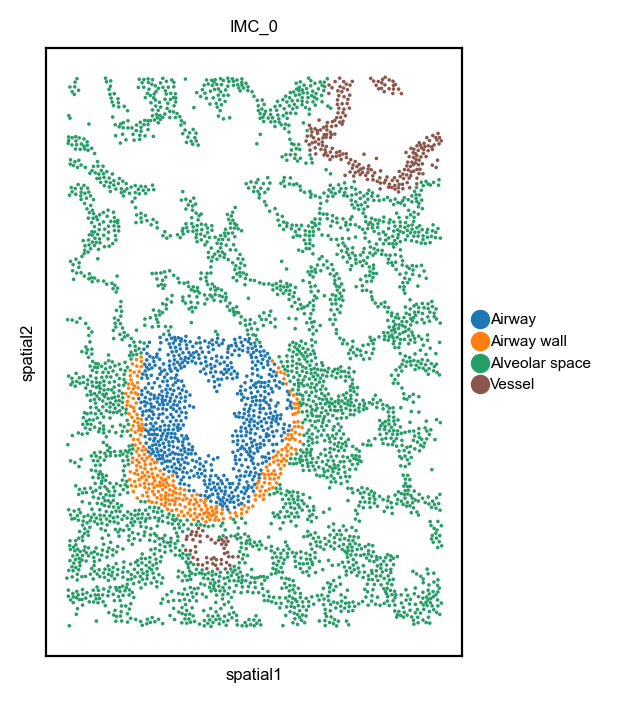

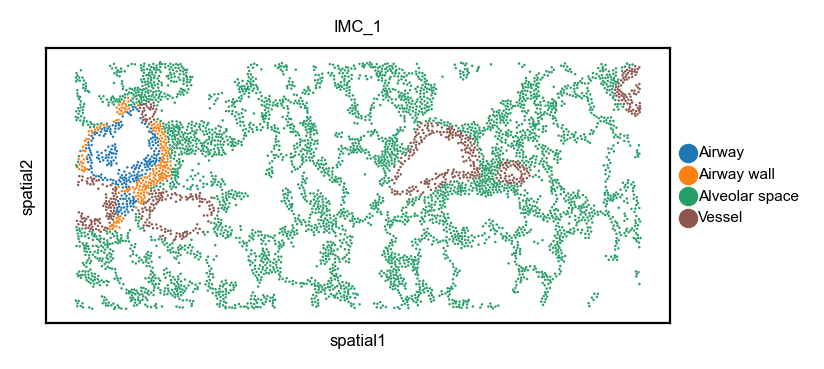

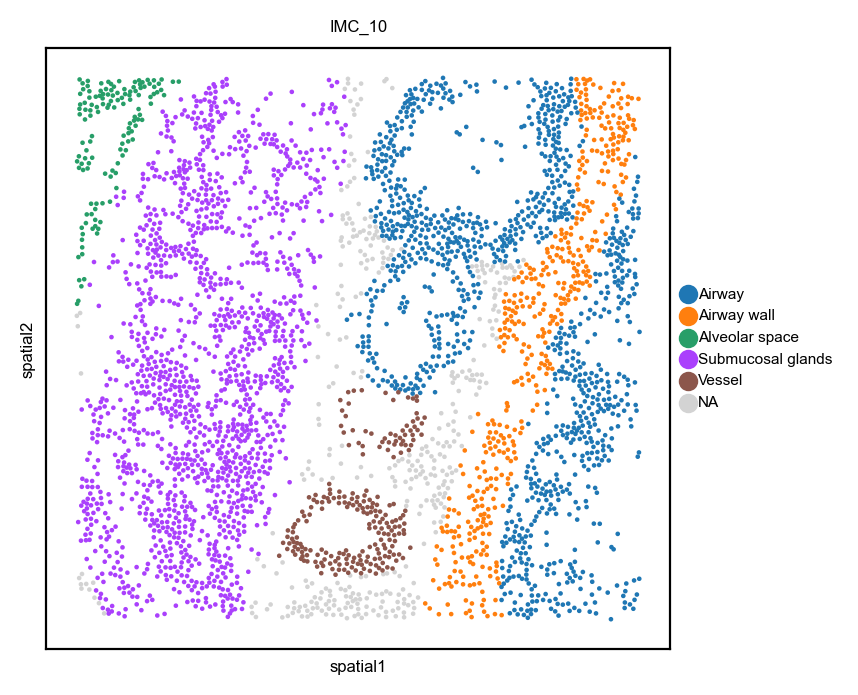

In [30]:
for img in adata.obs['roi'].unique()[:3]:
    a = adata[adata.obs['roi'] == img].copy()
    slide = a.obs['slide'].unique()[0]
    sc.pl.spatial(a, spot_size = 8, color = 'domain', title = slide)

# Running UTAG

In [34]:
%%time
results = utag(
    adata,
    slide_key="roi",
    max_dist=12,
    normalization_mode='l1_norm',
    apply_clustering=True,
    clustering_method = 'leiden',
    resolutions = [0.05, 0.1, 0.3, 0.5]
)

Applying UTAG Algorithm...


  0%|          | 0/4 [00:00<?, ?it/s]

Applying Leiden Clustering at Resolution: 0.05...


 25%|██▌       | 1/4 [00:18<00:55, 18.38s/it]

Applying Leiden Clustering at Resolution: 0.1...


 50%|█████     | 2/4 [00:38<00:39, 19.61s/it]

Applying Leiden Clustering at Resolution: 0.3...


 75%|███████▌  | 3/4 [01:11<00:25, 25.64s/it]

Applying Leiden Clustering at Resolution: 0.5...


100%|██████████| 4/4 [02:04<00:00, 31.23s/it]

Wall time: 2min 15s


In [35]:
for x in results.obs.columns[results.obs.columns.str.contains('UTAG Label_')]:
    print(x, len(results.obs[x].unique()))

UTAG Label_leiden_0.05 2
UTAG Label_leiden_0.1 7
UTAG Label_leiden_0.3 11
UTAG Label_leiden_0.5 13


## Annotating UTAG Labels

In [53]:
adata = sc.read('data/healthy_lung_adata.h5ad')
results = sc.read('data/healthy_lung_results.h5ad')

In [ ]:
cm = sns.clustermap(results.to_df().corr(), cmap="coolwarm", vmin=-1, vmax=1)
var_order = results.var.iloc[cm.dendrogram_col.reordered_ind].index

In [55]:
sc.pp.neighbors(results)
sc.tl.umap(results)

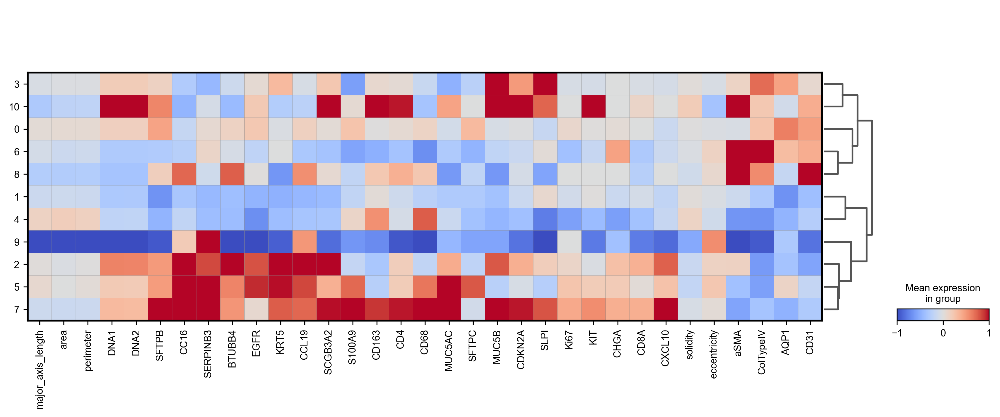

In [56]:
plt.ion()
sc.settings.set_figure_params(dpi=150, fontsize=10)
if 'dendrogram_UTAG Label_leiden_0.3' in results.uns:
    del results.uns['dendrogram_UTAG Label_leiden_0.3']
sc.pl.matrixplot(
    results,
    #var_names = results.var.index,
    var_names=var_order,
    groupby="UTAG Label_leiden_0.3",
    dendrogram=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    show=True,
    #save="healthy_lung UTAG leiden 0.3 Expression_healthy_only",
)

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


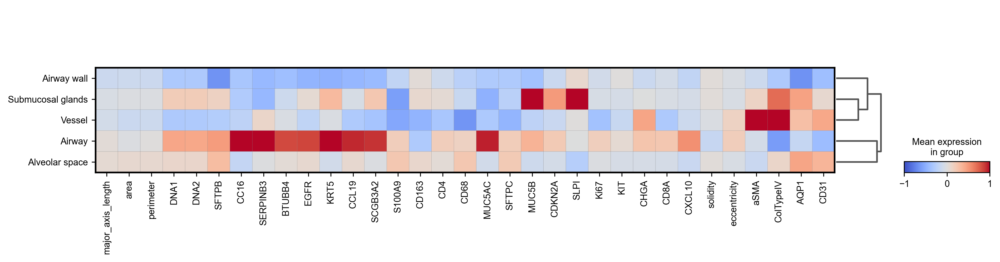

In [57]:

UTAG_map = {
    "0": "Alveolar space",
    "1": "Airway wall",
    "2": "Airway",
    "3": "Submucosal glands",
    "4": "Alveolar space",
    "5": "Airway",
    "6": "Vessel",
    "7": "Macrophage cluster",
    "8": "Vessel",
    "9": "Airway",
    "10": "Macrophage cluster",
}

results.obs['UTAG Label'] = pd.Categorical(results.obs["UTAG Label_leiden_0.3"].replace(UTAG_map))
adata.obs['UTAG Label'] = pd.Categorical(results.obs["UTAG Label_leiden_0.3"].replace(UTAG_map))

adata.obs['cell type'] = adata.obs['cell type'].replace({'Low Expression':'Connective'})
results.obs['cell type'] = results.obs['cell type'].replace({'Low Expression':'Connective'})

adata.obs['cell type'] = pd.Categorical(adata.obs['cell type'].replace({'Submucosal gland':'Submucosal glands'}))
results.obs['cell type'] = adata.obs['cell type']

adata = adata[adata.obs['UTAG Label'].isin(['Airway', 'Airway wall', 'Alveolar space', 'Submucosal glands', 'Vessel'])]
results = results[results.obs['UTAG Label'].isin(['Airway', 'Airway wall', 'Alveolar space', 'Submucosal glands', 'Vessel'])]

adata.uns["UTAG Label_colors"] = ['#1f77b4', '#ff7f0e', '#2ca02c', '#9467bd', '#8c564b']
results.uns["UTAG Label_colors"] = adata.uns["UTAG Label_colors"]

adata.uns['domain_colors'] = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#7f7f7f']
results.uns['domain_colors'] = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#7f7f7f']

adata.uns["cell type_colors"] = sns.color_palette("colorblind").as_hex()[
    : len(adata.obs["cell type"].unique())
]

results.uns["cell type_colors"] = sns.color_palette("colorblind").as_hex()[
    : len(results.obs["cell type"].unique())
]

if 'dendrogram_UTAG Label' in results.uns:
    del results.uns['dendrogram_UTAG Label']
sc.pl.matrixplot(
    results,
    var_names=var_order,
    groupby="UTAG Label",
    dendrogram=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    show=True,
    #save="healthy_lung UTAG label Expression_healthy_only",
)

## UTAG Label UMAP

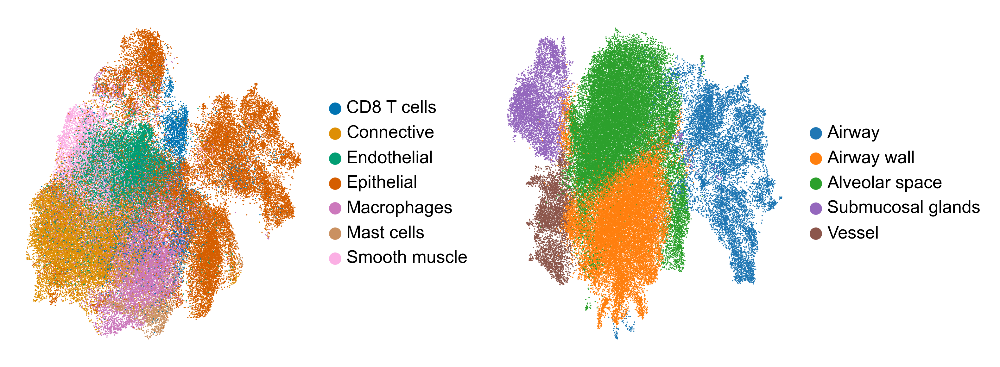

In [58]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3), dpi=200)
sc.pl.umap(
    adata,
    color="cell type",
    title="",
    frameon=False,
    legend_fontsize=10,
    legend_fontoutline=1,
    show=False,
    ax=axs[0],
    size=2,
    legend_fontweight="normal",
)

sc.pl.umap(
    results,
    color="UTAG Label",
    title="",
    frameon=False,
    show=False,
    ax=axs[1],
    size=2,
    legend_fontsize=10,
    legend_fontoutline=1,
    legend_fontweight="normal",
)

plt.tight_layout()
#plt.savefig("figures/healthy_lung Cell and Domain UMAP healthy only.pdf")

# Downstream Analysis With UTAG

## UTAG Micro-Anatomical Domain Cell Type Composition

C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


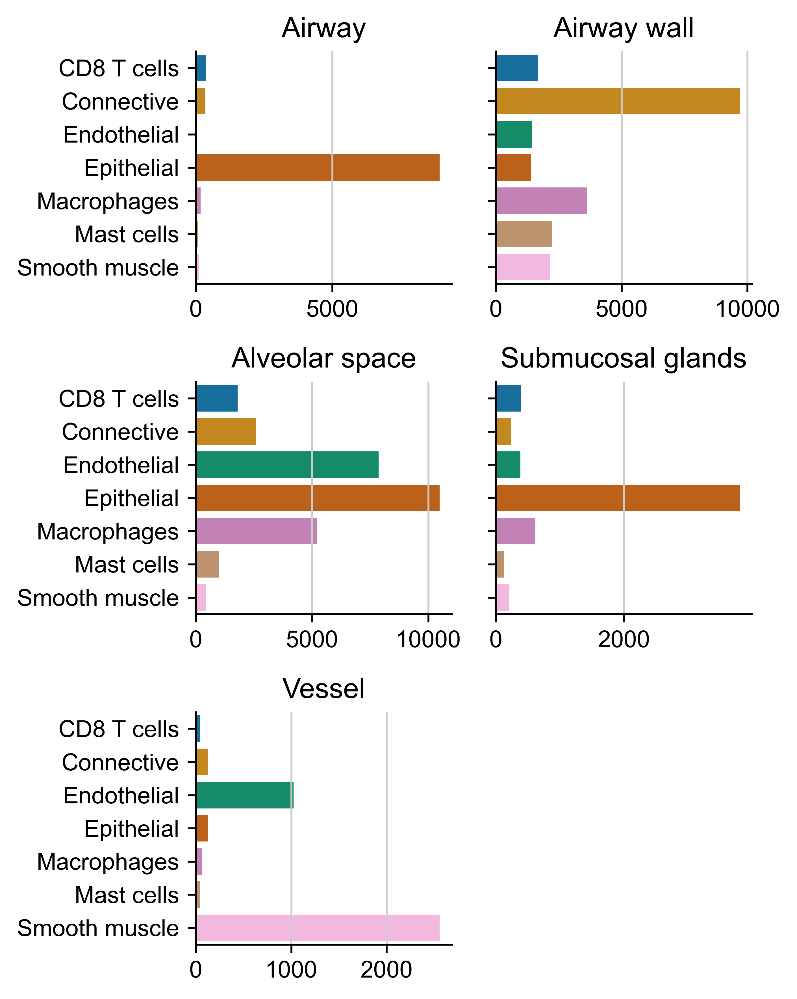

In [515]:
import seaborn as sns

g = sns.FacetGrid(
    data=adata.obs.groupby(["cell type", "UTAG Label"]).count()["sample"].reset_index(),
    hue="cell type",
    col="UTAG Label",
    col_wrap=2,
    aspect=1.2,
    palette="colorblind",
    sharex=False,
    height = 2,
)

g.map(sns.barplot, "sample",  "cell type")

# iterate over axes of FacetGrid
for i, ax in enumerate(g.axes.flat):
    labels = ax.get_yticklabels()  # get x labels
    #ax.set_xticklabels(labels, rotation=90, fontsize=10)  # set new labels
    titles = ax.get_title()
    titles = titles.replace("UTAG Label = ", "")
    ax.set_title(titles, fontsize=12)
    ax.set_ylabel("", fontsize=12)
    ax.set_xlabel("")
plt.tight_layout()
plt.savefig("figures/healthy_lung_Domain Composition_healthy_only.pdf")

## Quantification of Cell-to-Cell Interaction within Micro-Anatomical Domain

In [517]:
import holoviews as hv

hv.extension("svg")
slide_key = "roi"
celltype_key = "cell type"
domain_key = "UTAG Label"
tmp = celltype_connectivity(
    adata=adata, slide_key=slide_key, domain_key=domain_key, celltype_key=celltype_key
)
glob_fig = []
for label in tmp.uns["UTAG Label_celltype_adjacency_matrix"].keys():
    fig = adj2chord(
        tmp.uns["UTAG Label_celltype_adjacency_matrix"][label].loc[
            adata.obs[celltype_key].cat.categories,
            adata.obs[celltype_key].cat.categories,
        ],
        size=100,
    )
    fig.opts(
        title=label,
        fontsize={"title": 20, "labels": 0, "xticks": 0, "yticks": 0, "legend": 0},
        labels=None,
        cmap="colorblind",
        edge_cmap=sns.color_palette("colorblind").as_hex()[:7],
        node_color=sns.color_palette("colorblind").as_hex()[:7],
    )
    glob_fig.append(fig)

display(
    (
        glob_fig[0]
        + glob_fig[2]
        + glob_fig[1]
        + glob_fig[4]
        + glob_fig[3]
    ).cols(2)
)

hv.save(
    (
        glob_fig[0]
        + glob_fig[2]
        + glob_fig[1]
        + glob_fig[4]
        + glob_fig[3]
    ).cols(2),
    "figures/healthy_lung_within_domain_celltype_interaction_healthy_only.pdf",
    fmt="pdf",
)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

100%|██████████| 26/26 [00:35<00:00,  1.38s/it]


:Layout
   .Chord.I   :Chord   [source,target]   (value)
   .Chord.II  :Chord   [source,target]   (value)
   .Chord.III :Chord   [source,target]   (value)
   .Chord.IV  :Chord   [source,target]   (value)
   .Chord.V   :Chord   [source,target]   (value)

## Visualization of Domain-Domain Interaction

In [518]:
r_ = domain_connectivity(results, slide_key = "roi", domain_key = "UTAG Label")

100%|██████████| 26/26 [00:13<00:00,  1.91it/s]


In [535]:

def draw_network(
    adata,
    node_key: str = 'UTAG Label',
    adjacency_matrix_key: str = 'UTAG Label_domain_adjacency_matrix',
    figsize: tuple = (11,11),
    dpi: int = 200,
    font_size: int = 12,
    node_size_min: int = 1000,
    node_size_max: int = 3000,
    edge_weight: float = 5,
    edge_weight_baseline: float = 1,
    log_transform: bool = True,
    ax = None
):
    import networkx as nx
    s1 = adata.obs.groupby(node_key).count()
    s1 = s1[s1.columns[0]]
    node_size = s1.values
    node_size = (node_size - node_size.min()) / (node_size.max() - node_size.min()) * (node_size_max - node_size_min) + node_size_min
    
    if ax == None:
        fig = plt.figure(figsize = figsize, dpi = dpi)
    G = nx.from_numpy_matrix(np.matrix(adata.uns[adjacency_matrix_key]), create_using=nx.Graph)
    G = nx.relabel.relabel_nodes(G, {i: label for i, label in enumerate(adata.uns[adjacency_matrix_key].index)})
    
    edges, weights = zip(*nx.get_edge_attributes(G,'weight').items())
    
    weights = np.array(list(weights))
    weights = (weights - weights.min()) / (weights.max() - weights.min()) * edge_weight + edge_weight_baseline
    
    if log_transform:
        weights = np.log(np.array(list(weights))+1)
    else:
        weights = np.array(list(weights))
        
    weights = tuple(weights.tolist())
    
    #pos = nx.spectral_layout(G, weight = 'weight')
    pos = nx.spring_layout(G, weight = 'weight', seed = 42, k = 0.7)
    
    if ax:
        nx.draw(G, pos, node_color='w', edgelist=edges, edge_color=weights, width=weights, edge_cmap=plt.cm.coolwarm, with_labels=True, font_size = font_size, node_size = node_size, ax = ax)
    else:
        nx.draw(G, pos, node_color='w', edgelist=edges, edge_color=weights, width=weights, edge_cmap=plt.cm.coolwarm, with_labels=True, font_size = font_size, node_size = node_size)

    if ax == None:
        ax = plt.gca()
    
    color_key = node_key + '_colors'
    if color_key in adata.uns:
        ax.collections[0].set_edgecolor(adata.uns[color_key])
        ax.collections[0].set_facecolor(adata.uns[color_key])
    else:
        ax.collections[0].set_edgecolor('lightgray')
    ax.collections[0].set_linewidth(3)
    ax.set_xlim([1.3*x for x in ax.get_xlim()])
    ax.set_ylim([1*y for y in ax.get_ylim()])
    
    if ax == None:
        return fig

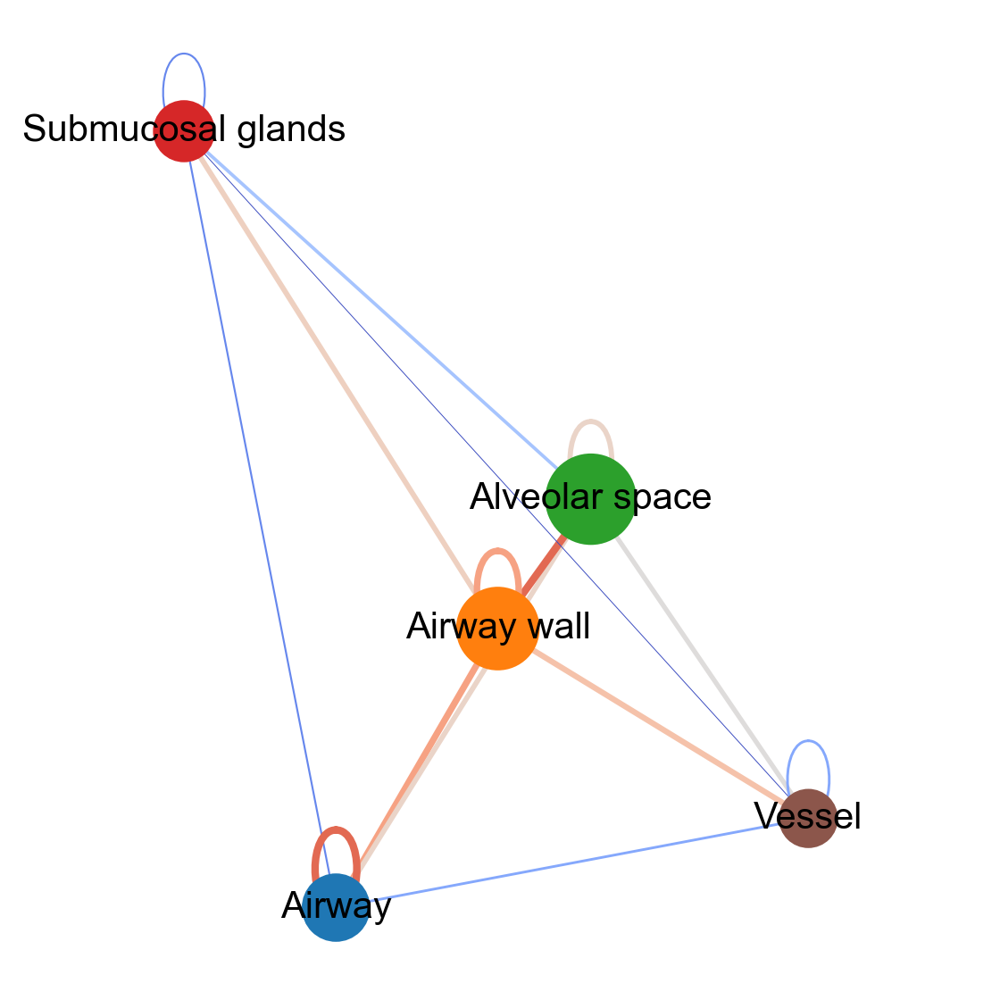

In [536]:
fig = draw_network(
    adata=r_,
    font_size=30,
    edge_weight = 1000,
    edge_weight_baseline=1,
    dpi=50,
    node_size_max=5000,
    node_size_min=2000,
)

plt.savefig("figures/healthy_lung_Domain_network_healthy_only.pdf")

# Evaluation of Performance

In [42]:
# for healthy data only
adata = sc.read('data/healthy_lung_adata.h5ad')

In [48]:
import numpy as np

rng = np.random.default_rng(12345)

from sklearn.metrics import homogeneity_score, rand_score
adata.obs['domain'] = adata.obs['domain'].astype(str)
random_rand_score_list = []
random_homogeneity_score_list = []

for key in adata.obs["slide"].unique():
    batch = adata[adata.obs["slide"] == key, :].copy()
    
    batch.obs['domain'] = batch.obs['domain'].astype(str).fillna('NA')
    shuffled_domains = batch.obs['domain'].copy().tolist()
    np.random.shuffle(shuffled_domains)

    random_rand_score = rand_score(batch.obs["domain"].astype(str), shuffled_domains)
    random_homogeneity_score = homogeneity_score(
        batch.obs["domain"].astype(str), shuffled_domains
    )

    random_rand_score_list.append(random_rand_score)
    random_homogeneity_score_list.append(random_homogeneity_score)


rand_score_celltype = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="domain",
    pred_key="cell type",
    method="rand",
)
rand_score_utag = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="domain",
    pred_key="UTAG Label",
    method="rand",
)

homogeneity_score_celltype = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="domain",
    pred_key="cell type",
    method="homogeneity",
)
homogeneity_score_utag = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="domain",
    pred_key="UTAG Label",
    method="homogeneity",
)

In [49]:
utag_resolutions = ['UTAG Label_leiden_0.05', 'UTAG Label_leiden_0.1', 'UTAG Label_leiden_0.3', 'UTAG Label_leiden_0.5']
results.obs['domain'] = results.obs['domain'].astype(str)
rand_scores = []
homo_scores = []
for res in utag_resolutions:
    rand_score_utag = evaluate_performance(
        results,
        batch_key="slide",
        truth_key="domain",
        pred_key=res,
        method="rand",
    )

    homogeneity_score_utag = evaluate_performance(
        results,
        batch_key="slide",
        truth_key="domain",
        pred_key=res,
        method="homogeneity",
    )
    
    rand_scores.append(rand_score_utag)
    homo_scores.append(homogeneity_score_utag)

rand_score_res = pd.DataFrame(np.array(rand_scores), index = utag_resolutions)
homo_score_res = pd.DataFrame(np.array(homo_scores), index = utag_resolutions)

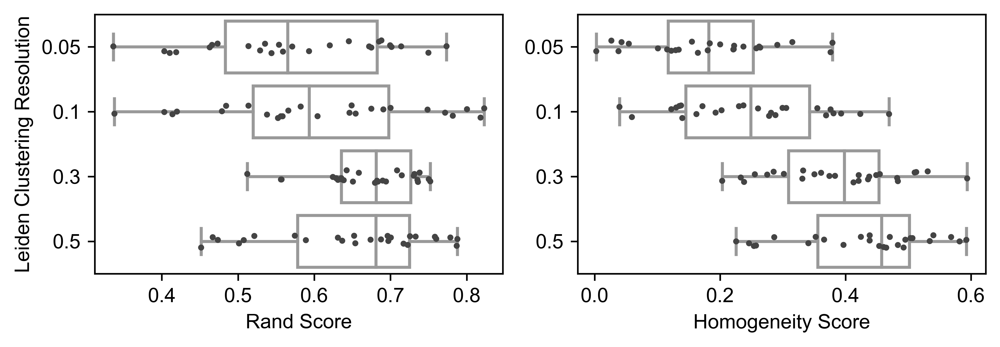

In [50]:
import matplotlib
matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42
matplotlib.rcParams["axes.grid"] = False

fig, ax = plt.subplots(1,2,figsize = (7,2.5))

rand_score_res_box_df = rand_score_res.T.melt()
sc.settings.set_figure_params(dpi=300, dpi_save=400, fontsize=10)
sns.boxplot(data = rand_score_res_box_df,
            y = 'variable', x = 'value', color = 'white',fliersize = 0, ax = ax[0])
sns.stripplot(data=rand_score_res_box_df,
            y = 'variable',
            x = 'value', s=3, color = '#444444', ax = ax[0])

ax[0].set_yticklabels(['0.05', '0.1', '0.3', '0.5'], fontsize = 10)
ax[0].set_ylabel('Leiden Clustering Resolution', fontsize = 10)
ax[0].set_xlabel('Rand Score', fontsize = 10)


homo_score_res_box_df = homo_score_res.T.melt()
sns.boxplot(data = homo_score_res_box_df,
            y = 'variable', x = 'value', color = 'white',fliersize = 0, ax = ax[1])
sns.stripplot(data=homo_score_res_box_df,
            y = 'variable',
            x = 'value', s=3, color = '#444444', ax = ax[1])


ax[1].set_yticklabels(['0.05', '0.1', '0.3', '0.5'], fontsize = 10)
plt.ylabel('')
plt.xlabel('Homogeneity Score', fontsize = 10)
plt.tight_layout()
#plt.savefig('figures/imc_healthy_resolution_healthy_only.pdf', bbox_inches = 'tight')

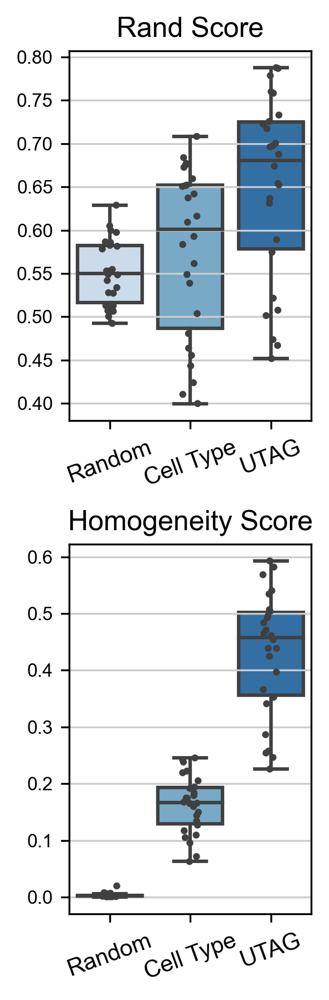

In [51]:
import seaborn as sns

sc.settings.set_figure_params(dpi=300, dpi_save=400, fontsize=8)
from sklearn.metrics import homogeneity_score, rand_score

rand_score_df = pd.DataFrame(
    {
        "Random": random_rand_score_list,
        "Cell Type": rand_score_celltype,
        "UTAG": rand_score_utag,
    }
)
homogeneity_score_df = pd.DataFrame(
    {
        "Random": random_homogeneity_score_list,
        "Cell Type": homogeneity_score_celltype,
        "UTAG": homogeneity_score_utag,
    }
)

fig, axs = plt.subplots(2, 1, figsize=(2, 6), dpi=150)


sns.boxplot(data=rand_score_df, palette="Blues", fliersize=0, ax=axs[0])
sns.stripplot(data=rand_score_df, color="0.25", s=3, ax=axs[0])
axs[0].set_title("Rand Score", fontsize=12)
axs[0].set_xticklabels(axs[0].get_xticklabels(), fontsize=10, rotation=20)


sns.boxplot(data=homogeneity_score_df, palette="Blues", fliersize=0, ax=axs[1])
sns.stripplot(data=homogeneity_score_df, color="0.25", s=3, ax=axs[1])
axs[1].set_title("Homogeneity Score", fontsize=12)
axs[1].set_xticklabels(axs[1].get_xticklabels(), fontsize=10, rotation=20)

plt.tight_layout()
#plt.savefig("figures/healthy_lung_benchmark_healthy_only.pdf")
plt.show()

In [52]:
import pingouin as pg

print("Rand Score: Random vs UTAG")
display(
    pg.mwu(x=rand_score_df["Random"], y=rand_score_df["UTAG"], alternative="two-sided")
)
print("Rand Score: Cell Type vs UTAG")
display(
    pg.mwu(
        x=rand_score_df["Cell Type"], y=rand_score_df["UTAG"], alternative="two-sided"
    )
)
print("Homogeneity Score: Random vs UTAG")
display(
    pg.mwu(
        x=homogeneity_score_df["Random"],
        y=homogeneity_score_df["UTAG"],
        alternative="two-sided",
    )
)
print("Homogeneity Score: Cell Type vs UTAG")
display(
    pg.mwu(
        x=homogeneity_score_df["Cell Type"],
        y=homogeneity_score_df["UTAG"],
        alternative="two-sided",
    )
)

Rand Score: Random vs UTAG


,U-val,alternative,p-val,RBC,CLES
MWU,156.0,two-sided,0.000895,0.538462,0.230769


,U-val,alternative,p-val,RBC,CLES
MWU,188.0,two-sided,0.006219,0.443787,0.278107


Rand Score: Cell Type vs UTAG


,U-val,alternative,p-val,RBC,CLES
MWU,0.0,two-sided,6.547527e-10,1.0,0.0


Homogeneity Score: Random vs UTAG


,U-val,alternative,p-val,RBC,CLES
MWU,3.0,two-sided,9.255420e-10,0.991124,0.004438


Homogeneity Score: Cell Type vs UTAG


C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.0, the latest is 0.5.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
